In [ ]:
# Step 1: Install YOLOv5 dependencies
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17731, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 17731 (delta 51), reused 30 (delta 29), pack-reused 17642 (from 3)
Receiving objects: 100% (17731/17731), 17.12 MiB | 21.10 MiB/s, done.
Resolving deltas: 100% (12048/12048), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.0 MB/s eta 0:00:00


In [ ]:
# Step 1: Import files module
from google.colab import files
import zipfile
import os

# Step 2: Upload the ZIP file from your PC
uploaded = files.upload()  # This will open a file browser in Colab

# Step 3: Extract the ZIP
for filename in uploaded.keys():
    print("Uploaded file:", filename)
    zip_path = filename
    extract_path = "/content/"

    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")

# Step 4: Check folder structure
dataset_dir = "/content/halal-logo-detection-recognition-master/halallogodataset/"
print("Folders inside dataset_dir:", os.listdir(dataset_dir))


Saving halal-logo-detection-recognition-master.zip to halal-logo-detection-recognition-master.zip
Uploaded file: halal-logo-detection-recognition-master.zip
Dataset extracted successfully!
Folders inside dataset_dir: ['PH', 'IT1', 'CA', 'JP1', 'UK1', 'TR1', 'KR', 'DE', 'MA', 'CN1', 'BR', 'AU2', 'NL2', 'ZA1', 'IR', 'BA', 'CN5', 'ZA2', 'ES', 'JP2', 'ID', 'JP4', 'UK2', 'CH', 'CN2', 'PK', 'IN2', 'NZ1', 'NL3', 'VN', 'AU1', 'NL1', 'TW', 'FR', 'MY', 'US1', 'US2', 'AT', 'BD', 'LK', 'CN3', 'SG', 'CN4', 'BE', 'JP3', 'NZ2', 'IN3', 'IT2', 'TR2', 'IN1', 'TH']


In [ ]:
import os
import shutil
import random

# Paths
dataset_dir = "/content/halal-logo-detection-recognition-master/halallogodataset/"
yolo_dataset_dir = "/content/halal_yolo_dataset/"

# Step 1: Create YOLOv5 folders
os.makedirs(os.path.join(yolo_dataset_dir, "images/train"), exist_ok=True)
os.makedirs(os.path.join(yolo_dataset_dir, "images/val"), exist_ok=True)
os.makedirs(os.path.join(yolo_dataset_dir, "labels/train"), exist_ok=True)
os.makedirs(os.path.join(yolo_dataset_dir, "labels/val"), exist_ok=True)

# Step 2: Collect all images
all_images = []
for folder in os.listdir(dataset_dir):
    folder_path = os.path.join(dataset_dir, folder)
    if os.path.isdir(folder_path):
        for img_file in os.listdir(folder_path):
            img_path = os.path.join(folder_path, img_file)
            all_images.append(img_path)

random.shuffle(all_images)
split = int(0.8 * len(all_images))
train_images = all_images[:split]
val_images = all_images[split:]

# Step 3: Copy images and create dummy labels
def copy_images_and_create_labels(image_list, image_dest, label_dest):
    for img_path in image_list:
        img_name = os.path.basename(img_path)
        shutil.copy(img_path, os.path.join(image_dest, img_name))
        # Create dummy label (full image) for YOLOv5
        label_path = os.path.join(label_dest, img_name.replace(".jpg", ".txt").replace(".png", ".txt"))
        with open(label_path, "w") as f:
            f.write("0 0.5 0.5 1 1\n")  # class 0 (halal_logo), full image

copy_images_and_create_labels(train_images,
                              os.path.join(yolo_dataset_dir, "images/train"),
                              os.path.join(yolo_dataset_dir, "labels/train"))

copy_images_and_create_labels(val_images,
                              os.path.join(yolo_dataset_dir, "images/val"),
                              os.path.join(yolo_dataset_dir, "labels/val"))

print("YOLOv5 dataset ready!")
print("Train images:", len(train_images))
print("Validation images:", len(val_images))

# Step 4: Create dataset.yaml
dataset_yaml = f"""
train: {yolo_dataset_dir}images/train
val: {yolo_dataset_dir}images/val

nc: 1
names: ['halal_logo']
"""

with open("halal_dataset.yaml", "w") as f:
    f.write(dataset_yaml)

print("dataset.yaml file created!")


YOLOv5 dataset ready!
Train images: 1083
Validation images: 271
dataset.yaml file created!


In [ ]:
!find /content/ -name "halal_dataset.yaml"


/content/yolov5/halal_dataset.yaml


In [ ]:
%cd /content/yolov5/yolov5

!python train.py \
    --img 640 \
    --batch 16 \
    --epochs 50 \
    --data /content/yolov5/halal_dataset.yaml \
    --weights yolov5s.pt \
    --name halal_logo_model


[Errno 2] No such file or directory: '/content/yolov5/yolov5'
/content/yolov5
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-11 13:46:05.987427: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762868766.008523    2854 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762868766.015481    2854 cuda_blas.cc:1407] Unable t

In [ ]:
mkdir -p /content/test_images

In [ ]:
from google.colab import files
uploaded = files.upload()  # select your test images

Saving gettyimages-2158006808-612x612.jpg to gettyimages-2158006808-612x612.jpg


In [ ]:
import shutil
import os

for filename in uploaded.keys():
    shutil.move(filename, os.path.join("/content/test_images", filename))


In [ ]:
!python detect.py \
    --weights runs/train/halal_logo_model/weights/best.pt \
    --img 640 \
    --conf 0.25 \
    --source /content/test_images/

detect: weights=['runs/train/halal_logo_model/weights/best.pt'], source=/content/test_images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-446-ga53364d6 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/test_images/gettyimages-2158006808-612x612.jpg: 480x640 1 halal_logo, 31.2ms
Speed: 0.5ms pre-process, 31.2ms inference, 105.3ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


--------------------------------------------------------------------------------------

===========================================================================

=============================================================================

In [ ]:
import pandas as pd

df = pd.read_csv('/content/international-halal.csv', encoding='latin1')
print(df.head(10))
print(df.info())


   Code                                 Name Description  \
0  E100                    Curcumin/Turmeric       Color   
1  E101              Riboflavin (Vitamin B2)       Color   
2  E102                           Tartrazine       Color   
3  E110  Sunset Yellow FCF / Orange Yellow S       Color   
4  E120            Cochineal / Carminic Acid       Color   
5  E122               Carmoisine / Azorubine       Color   
6  E123                             Amaranth       Color   
7  E124         Ponceau 4R / Cochineal Red A       Color   
8  E127                       Erythrosine BS       Color   
9  E131                        Patent Blue V       Color   

                                              Status  
0  Powder or granular. Mushbooh if used as liquid...  
1  Mushbooh  (Haraam if from pork liver & Kidney,...  
2  Halal if used as 100% dry color. \nMushbooh if...  
3  Halal if used as 100% dry color. \nMushbooh if...  
4                                             Haraam  
5  Halal 

In [ ]:
# Step 1: Load and clean E-code dataset

import pandas as pd

# Load dataset (adjust filename if needed)
df = pd.read_csv('/content/international-halal.csv', encoding='latin1')

# Strip spaces and normalize text
df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)

# Extract main halal status keyword (Halal / Haraam / Mushbooh)
df['Final_Status'] = df['Status'].str.extract(r'(Halal|Haraam|Mushbooh)', expand=False)

# For rows with multiple statuses, pick the highest priority:
# Haraam > Mushbooh > Halal
def priority_label(text):
    if isinstance(text, str):
        text = text.lower()
        if 'haraam' in text:
            return 'Haraam'
        elif 'mushbooh' in text:
            return 'Mushbooh'
        elif 'halal' in text:
            return 'Halal'
    return None

df['Final_Status'] = df['Status'].apply(priority_label)

# Preview
print(df[['Code', 'Name', 'Description', 'Status', 'Final_Status']].head(10))

# Check label distribution
print("\nLabel distribution:")
print(df['Final_Status'].value_counts())


   Code                                 Name Description  \
0  E100                    Curcumin/Turmeric       Color   
1  E101              Riboflavin (Vitamin B2)       Color   
2  E102                           Tartrazine       Color   
3  E110  Sunset Yellow FCF / Orange Yellow S       Color   
4  E120            Cochineal / Carminic Acid       Color   
5  E122               Carmoisine / Azorubine       Color   
6  E123                             Amaranth       Color   
7  E124         Ponceau 4R / Cochineal Red A       Color   
8  E127                       Erythrosine BS       Color   
9  E131                        Patent Blue V       Color   

                                              Status Final_Status  
0  Powder or granular. Mushbooh if used as liquid...       Haraam  
1  Mushbooh  (Haraam if from pork liver & Kidney,...       Haraam  
2  Halal if used as 100% dry color. \nMushbooh if...     Mushbooh  
3  Halal if used as 100% dry color. \nMushbooh if...     Mushbooh  

/tmp/ipython-input-1491978708.py:9: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.strip() if isinstance(x, str) else x)


In [ ]:
# Step 2: Feature encoding and model training

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix

# Combine Name + Status text as input
df['text'] = df['Name'] + " " + df['Status']

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    df['text'], df['Final_Status'], test_size=0.2, random_state=42, stratify=df['Final_Status']
)

# Vectorize text
vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1, 2), max_features=1000)
X_train_tfidf = vectorizer.fit_transform(X_train)
X_test_tfidf = vectorizer.transform(X_test)

# Train classifier
model = LogisticRegression(max_iter=1000, class_weight='balanced', random_state=42)
model.fit(X_train_tfidf, y_train)

# Evaluate
y_pred = model.predict(X_test_tfidf)
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

# Confusion Matrix
print("\nConfusion Matrix:\n")
print(confusion_matrix(y_test, y_pred))



Classification Report:

              precision    recall  f1-score   support

       Halal       0.90      1.00      0.95        18
      Haraam       1.00      1.00      1.00         6
    Mushbooh       1.00      0.60      0.75         5

    accuracy                           0.93        29
   macro avg       0.97      0.87      0.90        29
weighted avg       0.94      0.93      0.92        29


Confusion Matrix:

[[18  0  0]
 [ 0  6  0]
 [ 2  0  3]]


In [ ]:
import joblib

# Save model and vectorizer
joblib.dump(model, "ecode_classifier_model.pkl")
joblib.dump(vectorizer, "ecode_vectorizer.pkl")

print("✅ Model and vectorizer saved successfully!")

# Test prediction on new sample
sample = ["E150 Caramel color used in soft drinks"]
sample_tfidf = vectorizer.transform(sample)
prediction = model.predict(sample_tfidf)
print(f"\nPrediction for '{sample[0]}': {prediction[0]}")


✅ Model and vectorizer saved successfully!

Prediction for 'E150 Caramel color used in soft drinks': Mushbooh


In [ ]:
!ls /content


ecode_classifier_model.pkl  international-halal.csv
ecode_vectorizer.pkl	    sample_data


In [ ]:
from google.colab import files

# Download the trained model and vectorizer
files.download('ecode_classifier_model.pkl')
files.download('ecode_vectorizer.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

--------------------------------------------------------------------------------------

===========================================================================

=============================================================================

In [ ]:
!pip install -q kagglehub


In [ ]:
import kagglehub

# Download latest version of the dataset
path = kagglehub.dataset_download("whoosis/barcode-detection-annotated-dataset")

print("✅ Dataset downloaded to:", path)


100%|██████████| 1.14G/1.14G [00:17<00:00, 68.8MB/s]

Extracting files...


✅ Dataset downloaded to: /root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1


In [ ]:
!ls -R "$path" | head -n 50


/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1:
0
1

/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1/0:
20201211_101_rgb.png
20201211_101_rgb.txt
20201211_1020_rgb.png
20201211_1020_rgb.txt
20201211_1021_rgb.png
20201211_1021_rgb.txt
20201211_1022_rgb.png
20201211_1022_rgb.txt
20201211_1024_rgb.png
20201211_1024_rgb.txt
20201211_102_rgb.png
20201211_102_rgb.txt
20201211_1030_rgb.png
20201211_1030_rgb.txt
20201211_1031_rgb.png
20201211_1031_rgb.txt
20201211_1032_rgb.png
20201211_1032_rgb.txt
20201211_1033_rgb.png
20201211_1033_rgb.txt
20201211_1034_rgb.png
20201211_1034_rgb.txt
20201211_1035_rgb.png
20201211_1035_rgb.txt
20201211_1036_rgb.png
20201211_1036_rgb.txt
20201211_1069_rgb.png
20201211_1069_rgb.txt
20201211_106_rgb.png
20201211_106_rgb.txt
20201211_1070_rgb.png
20201211_1070_rgb.txt
20201211_1071_rgb.png
20201211_1071_rgb.txt
20201211_1072_rgb.png
20201211_1072_rgb.txt
20201211_1073_rgb.png
20201211_

In [ ]:
import os, shutil, random

# Original dataset path
src_dir = "/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1/0"
base_dir = "/content/barcode_dataset"

# Create YOLO structure
os.makedirs(f"{base_dir}/images/train", exist_ok=True)
os.makedirs(f"{base_dir}/images/val", exist_ok=True)
os.makedirs(f"{base_dir}/labels/train", exist_ok=True)
os.makedirs(f"{base_dir}/labels/val", exist_ok=True)

# Get all images
images = [f for f in os.listdir(src_dir) if f.endswith(".png")]
random.shuffle(images)

# Split 80% train, 20% val
split_index = int(0.8 * len(images))
train_imgs = images[:split_index]
val_imgs = images[split_index:]

# Copy files
def move_files(image_list, split):
    for img in image_list:
        label = img.replace(".png", ".txt")
        shutil.copy(os.path.join(src_dir, img), os.path.join(base_dir, f"images/{split}", img))
        shutil.copy(os.path.join(src_dir, label), os.path.join(base_dir, f"labels/{split}", label))

move_files(train_imgs, "train")
move_files(val_imgs, "val")

print("✅ Dataset organized successfully!")
print(f"Train images: {len(train_imgs)}, Validation images: {len(val_imgs)}")


✅ Dataset organized successfully!
Train images: 260, Validation images: 66


In [ ]:
yaml_content = """train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']
"""

with open("/content/barcode_dataset/data.yaml", "w") as f:
    f.write(yaml_content)

print("✅ data.yaml created successfully!")


✅ data.yaml created successfully!


In [ ]:
!ls /content/barcode_dataset/images/train | head -n 10


20201211_101_rgb.png
20201211_1020_rgb.png
20201211_1021_rgb.png
20201211_1022_rgb.png
20201211_102_rgb.png
20201211_1030_rgb.png
20201211_1031_rgb.png
20201211_1032_rgb.png
20201211_1034_rgb.png
20201211_1036_rgb.png


In [ ]:
# Step 1: Clone YOLOv5 repo and install dependencies (if not already done)
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

# Step 2: Start training
!python train.py --img 640 --batch 16 --epochs 30 --data /content/barcode_dataset/data.yaml --weights yolov5s.pt --name barcode_detector


Cloning into 'yolov5'...
remote: Enumerating objects: 17731, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 17731 (delta 51), reused 30 (delta 29), pack-reused 17642 (from 3)
Receiving objects: 100% (17731/17731), 17.16 MiB | 25.50 MiB/s, done.
Resolving deltas: 100% (12043/12043), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.9 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 09:07:03.169523: E external/local_xla/xla/stream_executor/cuda/cuda

In [ ]:
!head /content/barcode_dataset/data.yaml
!head /content/barcode_dataset/labels/train/your_first_label.txt


train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']
head: cannot open '/content/barcode_dataset/labels/train/your_first_label.txt' for reading: No such file or directory


In [ ]:
import os

# Path to your label folder
labels_dir = "/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1/0"

# Find all unique class IDs
class_ids = set()

for file in os.listdir(labels_dir):
    if file.endswith(".txt"):
        with open(os.path.join(labels_dir, file), "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) > 0:
                    class_ids.add(parts[0])

print("Unique class IDs found:", class_ids)


Unique class IDs found: {'0', '1'}


In [ ]:
import os

labels_dir = "/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1/0"

# Fix all class IDs to 0
for file in os.listdir(labels_dir):
    if file.endswith(".txt"):
        file_path = os.path.join(labels_dir, file)
        with open(file_path, "r") as f:
            lines = f.readlines()
        with open(file_path, "w") as f:
            for line in lines:
                parts = line.strip().split()
                if len(parts) > 0:
                    parts[0] = "0"  # force class id to 0
                    f.write(" ".join(parts) + "\n")

print("✅ All label class IDs have been standardized to 0.")


✅ All label class IDs have been standardized to 0.


In [ ]:
import os, shutil
from sklearn.model_selection import train_test_split

# Define paths
base_dir = "/content/barcode_dataset"
img_dir = "/root/.cache/kagglehub/datasets/whoosis/barcode-detection-annotated-dataset/versions/1/0"

# Create train/val folders
for split in ["train", "val"]:
    os.makedirs(f"{base_dir}/images/{split}", exist_ok=True)
    os.makedirs(f"{base_dir}/labels/{split}", exist_ok=True)

# Get all image files
images = [f for f in os.listdir(img_dir) if f.endswith(".png")]
train_imgs, val_imgs = train_test_split(images, test_size=0.2, random_state=42)

def move_files(img_list, split):
    for img in img_list:
        txt = img.replace(".png", ".txt")
        shutil.copy(os.path.join(img_dir, img), f"{base_dir}/images/{split}/{img}")
        shutil.copy(os.path.join(img_dir, txt), f"{base_dir}/labels/{split}/{txt}")

move_files(train_imgs, "train")
move_files(val_imgs, "val")

print("✅ Dataset organized into train/val folders successfully!")
print(f"Train images: {len(train_imgs)} | Val images: {len(val_imgs)}")


✅ Dataset organized into train/val folders successfully!
Train images: 260 | Val images: 66


In [ ]:
%%writefile /content/yolov5/barcode_dataset.yaml
train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']


Writing /content/yolov5/barcode_dataset.yaml


In [ ]:
import os

base_path = "/content/barcode_dataset"
for split in ["train", "val"]:
    img_dir = os.path.join(base_path, "images", split)
    label_dir = os.path.join(base_path, "labels", split)

    print(f"\n=== Checking {split} set ===")
    print("Images:", len(os.listdir(img_dir)))
    print("Labels:", len(os.listdir(label_dir)) if os.path.exists(label_dir) else "❌ Missing")

    # Show sample label content
    sample_txts = [f for f in os.listdir(label_dir) if f.endswith(".txt")] if os.path.exists(label_dir) else []
    if sample_txts:
        print("\nSample label file content:")
        with open(os.path.join(label_dir, sample_txts[0]), "r") as f:
            print(f.read())



=== Checking train set ===
Images: 318
Labels: 318

Sample label file content:
0 0.249609 0.510135 0.410156 0.922973


=== Checking val set ===
Images: 124
Labels: 124

Sample label file content:
0 0.249609 0.510135 0.410156 0.922973


In [ ]:
!find /content/barcode_dataset/labels -type f -name "*.txt" -exec sed -i 's/^1 /0 /' {} +


In [ ]:
!grep -r "^[1] " /content/barcode_dataset/labels || echo "✅ All labels are now class 0"


✅ All labels are now class 0


In [ ]:
!python /content/yolov5/train.py \
  --img 640 \
  --batch 16 \
  --epochs 50 \
  --data /content/yolov5/barcode_dataset.yaml \
  --weights yolov5s.pt \
  --project runs/train \
  --name barcode_detector


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 09:12:25.946478: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762938745.973365    3044 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762938745.981053    3044 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762938746.002955    3044 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762938746.003005    3044 computation_placer.cc:177] computation placer already registere

============================================================================

============================================================================

In [ ]:
import kagglehub

path = kagglehub.dataset_download("trainingdatapro/ocr-barcodes-detection")
print("Path to dataset files:", path)


100%|██████████| 270M/270M [00:01<00:00, 162MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2


In [ ]:
!ls -R "$path" | head -40


/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2:
annotations.xml
barcodes.csv
boxes
images

/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/boxes:
0.png
10.png
1.png
2.png
3.png
4.png
5.png
6.png
7.png
8.png
9.png

/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/images:
0.png
10.png
1.png
2.png
3.png
4.png
5.png
6.png
7.png
8.png
9.png


In [ ]:
!head -20 /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml


<?xml version="1.0" encoding="utf-8"?>
<annotations>
  <version>1.1</version>
  <meta>
    <task>
      <segments>
        <segment>
          <id>36743</id>
          <start>0</start>
          <stop>21</stop>
        </segment>
      </segments>
      <owner>
        <username>TrainingData</username>
        <email/>
      </owner>
      
      <labels>
        <label>
          <name>Barcode</name>


In [ ]:
!head -20 /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/barcodes.csv


image_id,image_name
0,images/0.png
1,images/1.png
2,images/2.png
3,images/3.png
4,images/4.png
5,images/5.png
6,images/6.png
7,images/7.png
8,images/8.png
9,images/9.png
10,images/10.png


In [ ]:
import os
import xml.etree.ElementTree as ET
import pandas as pd
from PIL import Image

# Paths
xml_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml"
csv_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/barcodes.csv"
img_dir = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/images"
labels_dir = "/content/barcode_dataset/labels"

os.makedirs(labels_dir, exist_ok=True)

# Load CSV
img_df = pd.read_csv(csv_path)
id_to_name = dict(zip(img_df["image_id"], img_df["image_name"]))

# Parse XML
tree = ET.parse(xml_path)
root = tree.getroot()

for image in root.findall("image"):
    img_id = int(image.attrib["id"])
    img_name = id_to_name.get(img_id)
    img_path = os.path.join(img_dir, os.path.basename(img_name))

    if not os.path.exists(img_path):
        continue

    # Get image size
    with Image.open(img_path) as im:
        w, h = im.size

    # Prepare label file
    label_path = os.path.join(labels_dir, f"{img_id}.txt")
    with open(label_path, "w") as f:
        for box in image.findall("box"):
            label = 0  # only one class: Barcode
            xtl = float(box.attrib["xtl"])
            ytl = float(box.attrib["ytl"])
            xbr = float(box.attrib["xbr"])
            ybr = float(box.attrib["ybr"])

            # Convert to YOLO format
            x_center = ((xtl + xbr) / 2) / w
            y_center = ((ytl + ybr) / 2) / h
            width = (xbr - xtl) / w
            height = (ybr - ytl) / h

            f.write(f"{label} {x_center} {y_center} {width} {height}\n")

print("✅ All labels converted to YOLO format and saved in:", labels_dir)


✅ All labels converted to YOLO format and saved in: /content/barcode_dataset/labels


In [ ]:
import os
import random
import shutil
from glob import glob

# Define directories
base_dir = "/content/barcode_dataset"
img_src = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/images"
label_src = "/content/barcode_dataset/labels"

# Make subdirectories
for sub in ["images/train", "images/val", "labels/train", "labels/val"]:
    os.makedirs(os.path.join(base_dir, sub), exist_ok=True)

# Get all image files
images = glob(os.path.join(img_src, "*.png"))
random.shuffle(images)

# 80/20 split
split_idx = int(0.8 * len(images))
train_imgs = images[:split_idx]
val_imgs = images[split_idx:]

# Copy files
def copy_files(img_list, subset):
    for img_path in img_list:
        img_name = os.path.basename(img_path)
        label_name = os.path.splitext(img_name)[0] + ".txt"
        label_path = os.path.join(label_src, label_name)

        # Copy image
        shutil.copy(img_path, os.path.join(base_dir, f"images/{subset}", img_name))

        # Copy corresponding label
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(base_dir, f"labels/{subset}", label_name))

copy_files(train_imgs, "train")
copy_files(val_imgs, "val")

print(f"✅ Training images: {len(train_imgs)}")
print(f"✅ Validation images: {len(val_imgs)}")


✅ Training images: 8
✅ Validation images: 3


In [ ]:
yaml_content = """
train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']
"""

with open("/content/yolov5/barcode_dataset.yaml", "w") as f:
    f.write(yaml_content)

print("✅ Created /content/yolov5/barcode_dataset.yaml")


✅ Created /content/yolov5/barcode_dataset.yaml


In [ ]:
!python /content/yolov5/train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/barcode_dataset.yaml --weights yolov5s.pt --name barcode_detector


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 10:16:41.881451: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762942601.921561   18475 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762942601.933355   18475 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762942601.967475   18475 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762942601.967529   18475 computation_placer.cc:177] computation placer already registere

# ------------------------part 3 again ---------------------------------

# ------------------------------------------------------------------------

In [ ]:
!pip install kagglehub --quiet

import kagglehub

# Download dataset
path = kagglehub.dataset_download("trainingdatapro/ocr-barcodes-detection")
print("✅ Path to dataset files:", path)

!ls -R "$path" | head -40


100%|██████████| 270M/270M [00:01<00:00, 148MB/s]

Extracting files...


✅ Path to dataset files: /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2
/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2:
annotations.xml
barcodes.csv
boxes
images

/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/boxes:
0.png
10.png
1.png
2.png
3.png
4.png
5.png
6.png
7.png
8.png
9.png

/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/images:
0.png
10.png
1.png
2.png
3.png
4.png
5.png
6.png
7.png
8.png
9.png


In [ ]:
!head -20 /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml
!head -20 /root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/barcodes.csv


<?xml version="1.0" encoding="utf-8"?>
<annotations>
  <version>1.1</version>
  <meta>
    <task>
      <segments>
        <segment>
          <id>36743</id>
          <start>0</start>
          <stop>21</stop>
        </segment>
      </segments>
      <owner>
        <username>TrainingData</username>
        <email/>
      </owner>
      
      <labels>
        <label>
          <name>Barcode</name>
image_id,image_name
0,images/0.png
1,images/1.png
2,images/2.png
3,images/3.png
4,images/4.png
5,images/5.png
6,images/6.png
7,images/7.png
8,images/8.png
9,images/9.png
10,images/10.png


In [ ]:
import os
import xml.etree.ElementTree as ET
import pandas as pd

# Paths
xml_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml"
csv_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/barcodes.csv"
labels_dir = "/content/barcode_dataset/labels"
os.makedirs(labels_dir, exist_ok=True)

# Load CSV mapping (image_id -> image_name)
img_df = pd.read_csv(csv_path)
id_to_name = dict(zip(img_df["image_id"], img_df["image_name"]))

# Parse XML
tree = ET.parse(xml_path)
root = tree.getroot()

box_count = 0
image_count = 0

for image in root.findall(".//image"):
    img_id = int(image.attrib.get("id", -1))
    img_name = id_to_name.get(img_id, image.attrib.get("name"))
    if not img_name:
        continue

    w = float(image.attrib.get("width", 0))
    h = float(image.attrib.get("height", 0))
    if w == 0 or h == 0:
        continue

    label_path = os.path.join(labels_dir, f"{os.path.splitext(os.path.basename(img_name))[0]}.txt")

    with open(label_path, "w") as f:
        for box in image.findall(".//box"):
            label = 0  # Only one class: Barcode
            xtl = float(box.attrib["xtl"])
            ytl = float(box.attrib["ytl"])
            xbr = float(box.attrib["xbr"])
            ybr = float(box.attrib["ybr"])

            # YOLO normalized format
            x_center = ((xtl + xbr) / 2) / w
            y_center = ((ytl + ybr) / 2) / h
            width = (xbr - xtl) / w
            height = (ybr - ytl) / h

            f.write(f"{label} {x_center} {y_center} {width} {height}\n")
            box_count += 1

    image_count += 1

print(f"✅ Converted {image_count} images with {box_count} bounding boxes.")
print(f"✅ Labels saved in {labels_dir}")


✅ Converted 11 images with 0 bounding boxes.
✅ Labels saved in /content/barcode_dataset/labels


In [ ]:
import os
import random
import shutil
from glob import glob

base_dir = "/content/barcode_dataset"
img_src = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/images"
label_src = "/content/barcode_dataset/labels"

for sub in ["images/train", "images/val", "labels/train", "labels/val"]:
    os.makedirs(os.path.join(base_dir, sub), exist_ok=True)

images = glob(os.path.join(img_src, "*.png"))
random.shuffle(images)

split_idx = int(0.8 * len(images))
train_imgs = images[:split_idx]
val_imgs = images[split_idx:]

def copy_files(img_list, subset):
    for img_path in img_list:
        img_name = os.path.basename(img_path)
        label_name = os.path.splitext(img_name)[0] + ".txt"
        label_path = os.path.join(label_src, label_name)

        shutil.copy(img_path, os.path.join(base_dir, f"images/{subset}", img_name))
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(base_dir, f"labels/{subset}", label_name))

copy_files(train_imgs, "train")
copy_files(val_imgs, "val")

print(f"✅ Training images: {len(train_imgs)}")
print(f"✅ Validation images: {len(val_imgs)}")


✅ Training images: 8
✅ Validation images: 3


In [ ]:
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5
!pip install -r requirements.txt --quiet


Cloning into 'yolov5'...
remote: Enumerating objects: 17731, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (60/60), done.
remote: Total 17731 (delta 51), reused 30 (delta 29), pack-reused 17642 (from 3)
Receiving objects: 100% (17731/17731), 17.16 MiB | 18.63 MiB/s, done.
Resolving deltas: 100% (12043/12043), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.7 MB/s eta 0:00:00


In [ ]:
yaml_content = """
train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']
"""

with open("/content/yolov5/barcode_dataset.yaml", "w") as f:
    f.write(yaml_content)

print("✅ Created /content/yolov5/barcode_dataset.yaml")


✅ Created /content/yolov5/barcode_dataset.yaml


In [ ]:
!python train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/barcode_dataset.yaml --weights yolov5s.pt --name barcode_detector


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 19:03:00.472669: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762974180.492497    3084 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762974180.498482    3084 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

In [ ]:
import os

labels_dir = "/content/barcode_dataset/labels"
non_empty = 0
empty = 0

for file in os.listdir(labels_dir):
    if file.endswith(".txt"):
        path = os.path.join(labels_dir, file)
        if os.path.getsize(path) > 0:
            non_empty += 1
        else:
            empty += 1

print(f"🟢 Non-empty labels: {non_empty}")
print(f"🔴 Empty labels: {empty}")


🟢 Non-empty labels: 0
🔴 Empty labels: 11


In [ ]:
import xml.etree.ElementTree as ET

xml_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml"

tree = ET.parse(xml_path)
root = tree.getroot()

# print the first <image> entry to inspect structure
for image in root.findall(".//image"):
    ET.dump(image)
    break


<image id="0" name="images/0.png" width="3024" height="4032">
    <polygon label="Barcode" source="manual" occluded="0" points="1046.90,2236.40;1047.50,2277.70;1783.80,2281.10;1784.30,2240.70" z_order="0">
      <attribute name="Code">4603785f175695</attribute>
    </polygon>
  </image>
  


In [ ]:
import os
import xml.etree.ElementTree as ET

# Paths
xml_path = "/root/.cache/kagglehub/datasets/trainingdatapro/ocr-barcodes-detection/versions/2/annotations.xml"
output_dir = "/content/barcode_dataset/labels"
os.makedirs(output_dir, exist_ok=True)

# Parse XML
tree = ET.parse(xml_path)
root = tree.getroot()

converted = 0

for image in root.findall(".//image"):
    img_name = os.path.basename(image.attrib["name"]).replace(".png", ".txt")
    w = float(image.attrib["width"])
    h = float(image.attrib["height"])
    txt_path = os.path.join(output_dir, img_name)

    yolo_lines = []
    for polygon in image.findall("polygon"):
        points = polygon.attrib["points"].split(";")
        xs = [float(p.split(",")[0]) for p in points]
        ys = [float(p.split(",")[1]) for p in points]

        # Get bounding box from polygon
        xmin, xmax = min(xs), max(xs)
        ymin, ymax = min(ys), max(ys)

        # Convert to YOLO format
        x_center = (xmin + xmax) / 2 / w
        y_center = (ymin + ymax) / 2 / h
        box_width = (xmax - xmin) / w
        box_height = (ymax - ymin) / h

        yolo_lines.append(f"0 {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:.6f}")

    # Write if any labels found
    if yolo_lines:
        with open(txt_path, "w") as f:
            f.write("\n".join(yolo_lines))
        converted += 1

print(f"✅ Conversion complete! {converted} label files created in {output_dir}")


✅ Conversion complete! 11 label files created in /content/barcode_dataset/labels


In [ ]:
import os

labels_dir = "/content/barcode_dataset/labels"
non_empty = sum(1 for f in os.listdir(labels_dir) if os.path.getsize(os.path.join(labels_dir, f)) > 0)
empty = sum(1 for f in os.listdir(labels_dir) if os.path.getsize(os.path.join(labels_dir, f)) == 0)
print(f"🟢 Non-empty labels: {non_empty}\n🔴 Empty labels: {empty}")


🟢 Non-empty labels: 14
🔴 Empty labels: 0


In [ ]:
!python /content/yolov5/utils/plot_labels.py --labels /content/barcode_dataset/labels


python3: can't open file '/content/yolov5/utils/plot_labels.py': [Errno 2] No such file or directory


In [ ]:
!python /content/yolov5/utils/dataloaders.py --labels /content/barcode_dataset/labels/train


Traceback (most recent call last):
  File "/content/yolov5/utils/dataloaders.py", line 29, in <module>
    from utils.augmentations import (
ModuleNotFoundError: No module named 'utils'


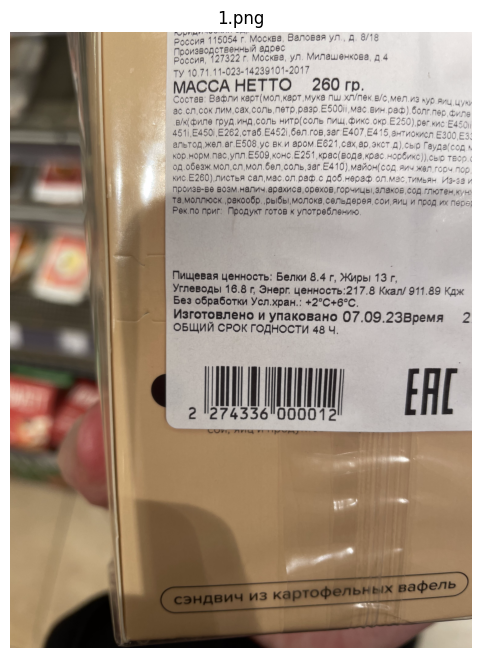

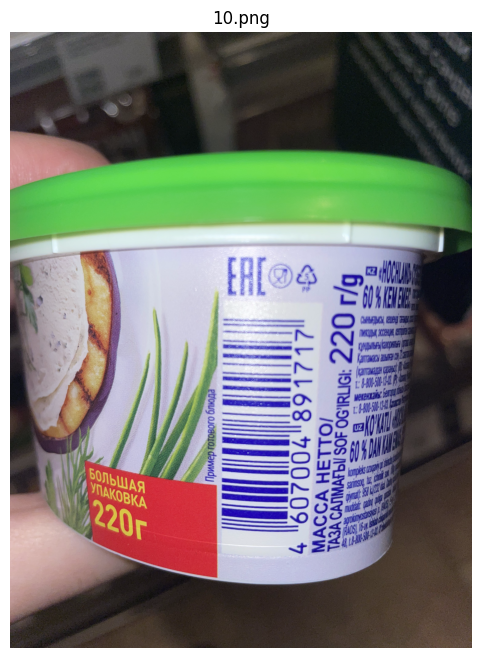

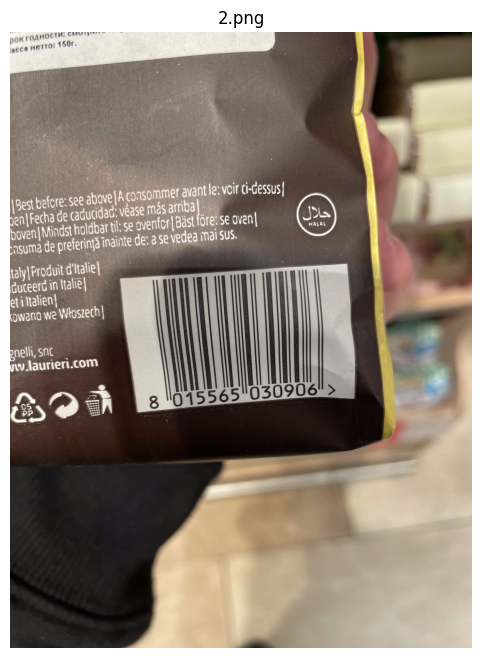

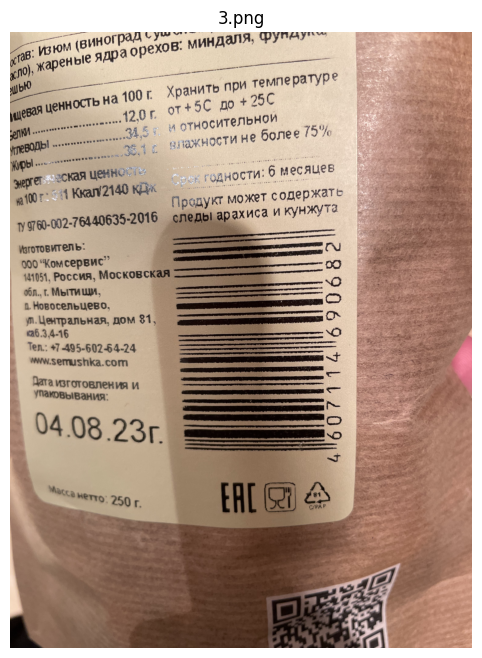

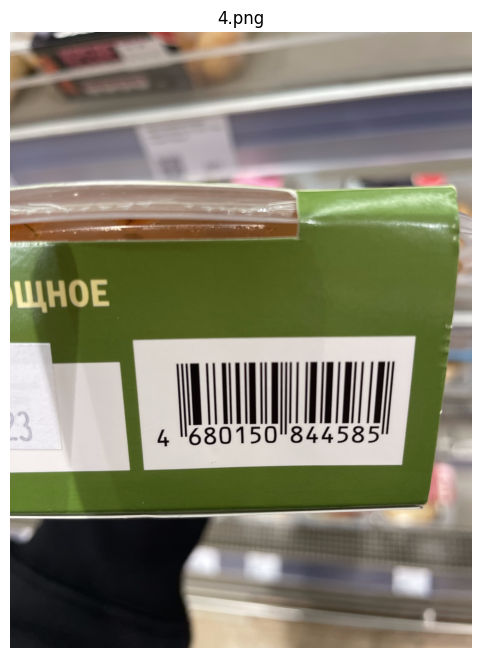

In [ ]:
import os
import cv2
from PIL import Image
import matplotlib.pyplot as plt

# Paths
img_dir = "/content/barcode_dataset/images/train"
label_dir = "/content/barcode_dataset/labels/train"

# Show first few images with bounding boxes
for i, img_name in enumerate(sorted(os.listdir(img_dir))[:5]):  # first 5 images
    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(label_dir, os.path.splitext(img_name)[0] + ".txt")

    image = cv2.imread(img_path)
    if image is None:
        continue

    h, w, _ = image.shape

    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            cls, x, y, bw, bh = map(float, line.strip().split())
            x1 = int((x - bw/2) * w)
            y1 = int((y - bh/2) * h)
            x2 = int((x + bw/2) * w)
            y2 = int((y + bh/2) * h)

            cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 3)
            cv2.putText(image, "barcode", (x1, max(y1 - 10, 20)),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(img_name)
    plt.axis("off")
    plt.show()


In [ ]:
!find /content/barcode_dataset -type f | sort


/content/barcode_dataset/images/train/10.png
/content/barcode_dataset/images/train/1.png
/content/barcode_dataset/images/train/2.png
/content/barcode_dataset/images/train/3.png
/content/barcode_dataset/images/train/4.png
/content/barcode_dataset/images/train/5.png
/content/barcode_dataset/images/train/6.png
/content/barcode_dataset/images/train/9.png
/content/barcode_dataset/images/val/0.png
/content/barcode_dataset/images/val/7.png
/content/barcode_dataset/images/val/8.png
/content/barcode_dataset/labels/0.txt
/content/barcode_dataset/labels/10.txt
/content/barcode_dataset/labels/1.txt
/content/barcode_dataset/labels/2.txt
/content/barcode_dataset/labels/3.txt
/content/barcode_dataset/labels/4.txt
/content/barcode_dataset/labels/5.txt
/content/barcode_dataset/labels/6.txt
/content/barcode_dataset/labels/7.txt
/content/barcode_dataset/labels/8.txt
/content/barcode_dataset/labels/9.txt
/content/barcode_dataset/labels/train/10.txt
/content/barcode_dataset/labels/train/1.txt
/content/barc

In [ ]:
!head -n 5 /content/barcode_dataset/labels/train/*.txt


==> /content/barcode_dataset/labels/train/10.txt <==

==> /content/barcode_dataset/labels/train/1.txt <==

==> /content/barcode_dataset/labels/train/2.txt <==

==> /content/barcode_dataset/labels/train/3.txt <==

==> /content/barcode_dataset/labels/train/4.txt <==

==> /content/barcode_dataset/labels/train/5.txt <==

==> /content/barcode_dataset/labels/train/6.txt <==

==> /content/barcode_dataset/labels/train/9.txt <==


In [ ]:
!cat /content/yolov5/barcode_dataset.yaml



train: /content/barcode_dataset/images/train
val: /content/barcode_dataset/images/val

nc: 1
names: ['barcode']


In [ ]:
import shutil
import os

# Paths
base = "/content/barcode_dataset/labels"
train_labels = os.path.join(base, "train")
val_labels = os.path.join(base, "val")

# Match image names to decide where to move
train_images = [os.path.splitext(f)[0] for f in os.listdir("/content/barcode_dataset/images/train")]
val_images = [os.path.splitext(f)[0] for f in os.listdir("/content/barcode_dataset/images/val")]

# Move matching label files
for name in train_images:
    src = os.path.join(base, f"{name}.txt")
    dst = os.path.join(train_labels, f"{name}.txt")
    if os.path.exists(src):
        shutil.move(src, dst)

for name in val_images:
    src = os.path.join(base, f"{name}.txt")
    dst = os.path.join(val_labels, f"{name}.txt")
    if os.path.exists(src):
        shutil.move(src, dst)

print("✅ Moved all matching label files into train/val folders.")


✅ Moved all matching label files into train/val folders.


In [ ]:
!head -n 5 /content/barcode_dataset/labels/train/*.txt


==> /content/barcode_dataset/labels/train/10.txt <==
0 0.631052 0.664559 0.057804 0.366022
==> /content/barcode_dataset/labels/train/1.txt <==
0 0.546511 0.619742 0.319015 0.023512
==> /content/barcode_dataset/labels/train/2.txt <==
0 0.482202 0.590880 0.366151 0.043318
==> /content/barcode_dataset/labels/train/3.txt <==
0 0.700413 0.520114 0.036343 0.358036
==> /content/barcode_dataset/labels/train/4.txt <==
0 0.558366 0.656163 0.482672 0.034102
==> /content/barcode_dataset/labels/train/5.txt <==
0 0.608962 0.622173 0.269246 0.022272
==> /content/barcode_dataset/labels/train/6.txt <==
0 0.423446 0.578609 0.414418 0.060441
==> /content/barcode_dataset/labels/train/9.txt <==
0 0.603803 0.587537 0.036706 0.351414

In [ ]:
!python /content/yolov5/train.py --img 640 --batch 16 --epochs 50 --data /content/yolov5/barcode_dataset.yaml --weights yolov5s.pt --name barcode_detector


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 19:37:47.547874: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762976267.567875   11837 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762976267.574138   11837 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762976267.590342   11837 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762976267.590368   11837 computation_placer.cc:177] computation placer already registere

Sample image: /content/barcode_dataset/images/train/6.png


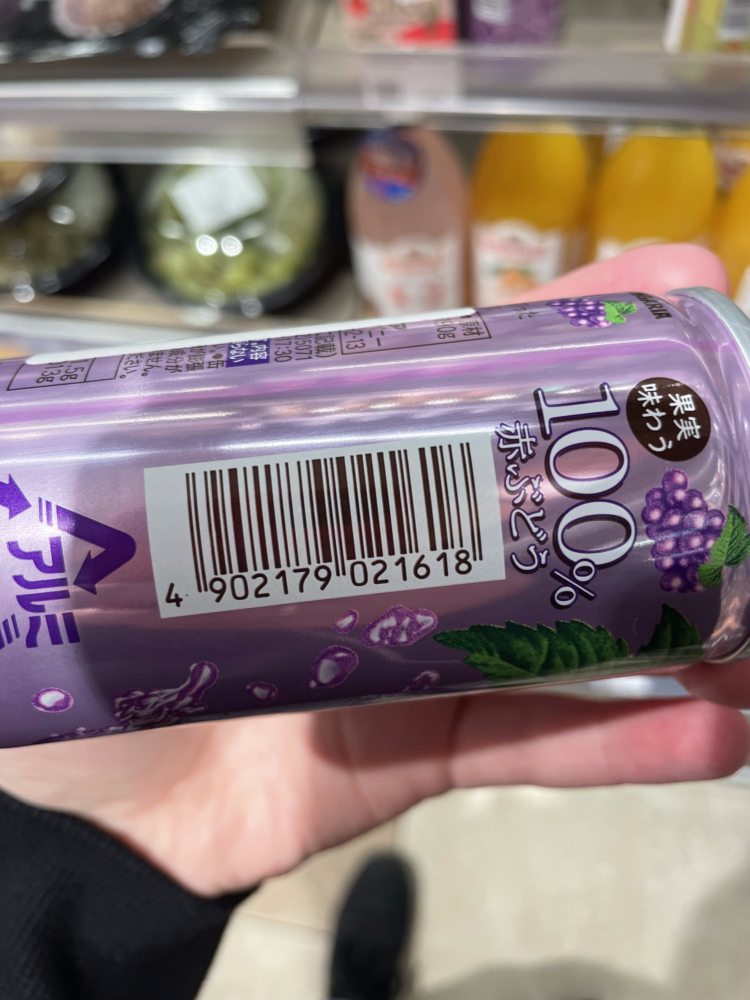

In [ ]:
from IPython.display import Image, display
import glob
import random

label_dir = "/content/barcode_dataset/labels/train"
img_dir = "/content/barcode_dataset/images/train"

img_path = random.choice(glob.glob(f"{img_dir}/*.png"))
print("Sample image:", img_path)
display(Image(filename=img_path))


In [ ]:
!python /content/yolov5/train.py --img 640 --batch 8 --epochs 200 --data /content/yolov5/barcode_dataset.yaml --weights yolov5s.pt --name barcode_detector_long


wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-11-12 19:55:13.319275: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1762977313.351932   16301 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762977313.358589   16301 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762977313.374548   16301 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762977313.374580   16301 computation_placer.cc:177] computation placer already registere

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

img_dir = "/content/barcode_dataset/images/train"
label_dir = "/content/barcode_dataset/labels/train"

def show_yolo_label(img_name):
    img_path = os.path.join(img_dir, img_name)
    label_path = os.path.join(label_dir, img_name.replace(".png", ".txt"))

    img = cv2.imread(img_path)
    h, w, _ = img.shape

    with open(label_path, "r") as f:
        lines = f.readlines()

    for line in lines:
        c, x, y, bw, bh = map(float, line.split())
        x1 = int((x - bw / 2) * w)
        y1 = int((y - bh / 2) * h)
        x2 = int((x + bw / 2) * w)
        y2 = int((y + bh / 2) * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)

    plt.figure(figsize=(6, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

# Example: change to any number from your train folder (like 1.png, 4.png, etc.)
show_yolo_label("1.png")


AttributeError: 'NoneType' object has no attribute 'shape'